In [ ]:
# Super-Resolution

# upscale_factor = 2
# epochs = 40

In [25]:
import os
import cv2
import math
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten, Input, MaxPooling2D, BatchNormalization
from tensorflow.keras import Model
from tensorflow.keras import layers
from tensorflow.keras import regularizers

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

from sklearn.utils import shuffle
from time import time

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]
from PIL import Image
# Set the seeds for reproducibility
from numpy.random import seed
from tensorflow.random import set_seed
seed_value = 18
seed(seed_value)
set_seed(seed_value)

In [26]:
import ssl # чтобы данные скачались
ssl._create_default_https_context = ssl._create_unverified_context

In [94]:
# Download dataset
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

In [109]:
crop_size = 300
upscale_factor = 2
input_size = int(crop_size // upscale_factor) ### input_size должен быть integer
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=seed_value,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=seed_value,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


In [110]:
int(input_size)

150

In [111]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image

# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

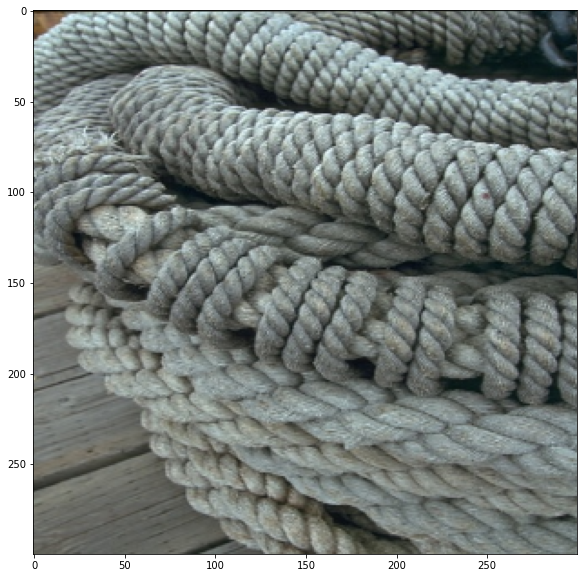

In [112]:
# show one image
img_test=list(train_ds)[1][2]
plt.imshow(img_test);

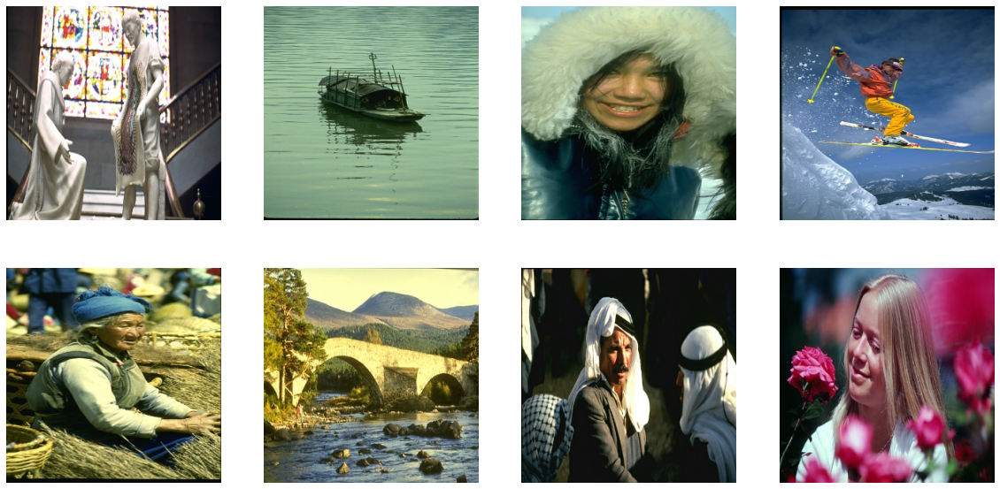

In [113]:
plt.figure(figsize=(20, 10))
for images in train_ds.take(1):
    for i in range(8):
        ax = plt.subplot(2, 4, i+1 )
        plt.imshow(images[i].numpy())
        plt.axis("off")

In [90]:
#for batch in train_ds.take(1):
#    for img in batch:
#        display(array_to_img(img))

In [114]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [115]:
# Crop and resize images
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")

def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y

In [116]:
train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

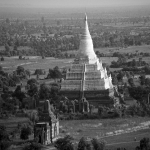

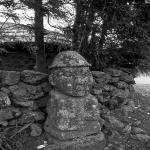

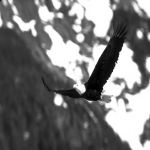

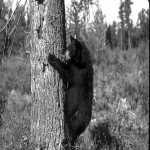

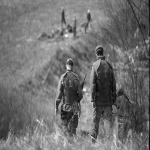

...

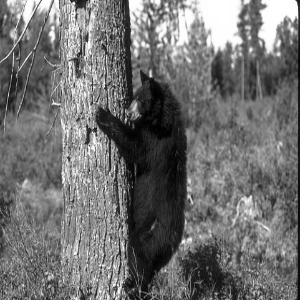

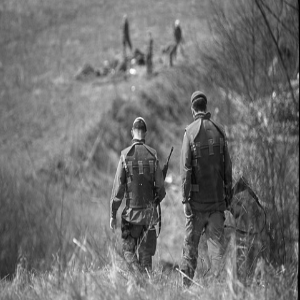

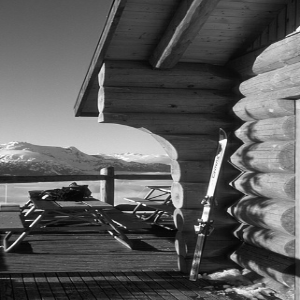

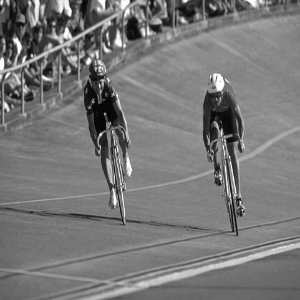

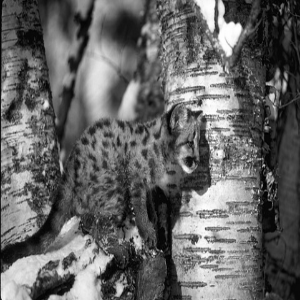

In [117]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

In [118]:
# Build a model
def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)   ########## int(...)
    outputs = tf.nn.depth_to_space(x, upscale_factor)
    
    return keras.Model(inputs, outputs)
   

In [119]:
# Define utility functions
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL
from PIL import Image

def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
       (int(img.size[0] // upscale_factor), int(img.size[1] // upscale_factor)),  ############ int(...)       
       # PIL.Image.BICUBIC,          пришлось убрать, т.к. не пошло.
    )
#cv2.resize(img, (img.size[0] // upscale_factor, img.size[1] // upscale_factor), interpolation = cv2.INTER_CUBIC)

def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size) # , PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size) # , PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

In [120]:
#Define callbacks to monitor training
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [121]:
#Define ModelCheckpoint and EarlyStopping callbacks.
import pathlib
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = 'C:/Users/User/anaconda3/envs/virenv/CVision/tmp/checkpoint'    #"/tmp/checkpoint"
#checkpoint_filepath = pathlib.Path(r'C:\Users\User\anaconda3\envs\virenv\CVision\tmp\checkpoint') 
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)   ############## max(2,upscale_factor)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_48 (Conv2D)          (None, None, None, 64)    1664      
                                                                 
 conv2d_49 (Conv2D)          (None, None, None, 64)    36928     
                                                                 
 conv2d_50 (Conv2D)          (None, None, None, 32)    18464     
                                                                 
 conv2d_51 (Conv2D)          (None, None, None, 4)     1156      
                                                                 
 tf.nn.depth_to_space_12 (TF  (None, None, None, 1)    0         
 OpLambda)                                                       
                                                           

Epoch 1/30
Mean PSNR for epoch: 22.76
1/1 [==============================] - 0s 115ms/step


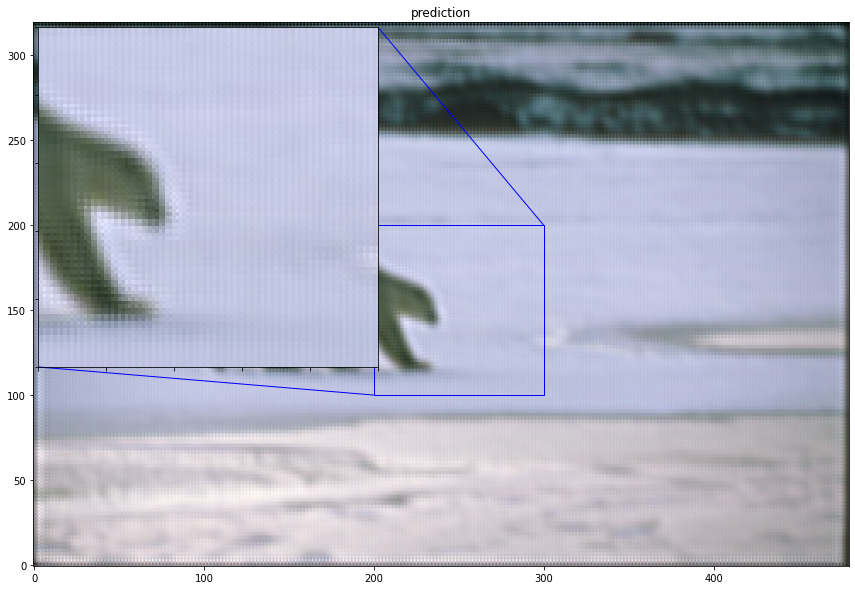

50/50 - 64s - loss: 0.0356 - val_loss: 0.0051 - 64s/epoch - 1s/step
Epoch 2/30
Mean PSNR for epoch: 26.67
50/50 - 60s - loss: 0.0035 - val_loss: 0.0021 - 60s/epoch - 1s/step
Epoch 3/30
Mean PSNR for epoch: 27.99
50/50 - 61s - loss: 0.0020 - val_loss: 0.0016 - 61s/epoch - 1s/step
Epoch 4/30
Mean PSNR for epoch: 28.31
50/50 - 67s - loss: 0.0017 - val_loss: 0.0015 - 67s/epoch - 1s/step
Epoch 5/30
Mean PSNR for epoch: 28.85
50/50 - 58s - loss: 0.0016 - val_loss: 0.0014 - 58s/epoch - 1s/step
Epoch 6/30
Mean PSNR for epoch: 28.35
50/50 - 56s - loss: 0.0016 - val_loss: 0.0014 - 56s/epoch - 1s/step
Epoch 7/30
Mean PSNR for epoch: 28.48
50/50 - 56s - loss: 0.0015 - val_loss: 0.0014 - 56s/epoch - 1s/step
Epoch 8/30
Mean PSNR for epoch: 28.15
50/50 - 54s - loss: 0.0015 - val_loss: 0.0014 - 54s/epoch - 1s/step
Epoch 9/30
Mean PSNR for epoch: 28.71
50/50 - 54s - loss: 0.0015 - val_loss: 0.0013 - 54s/epoch - 1s/step
Epoch 10/30
Mean PSNR for epoch: 28.66
50/50 - 54s - loss: 0.0015 - val_loss: 0.0014

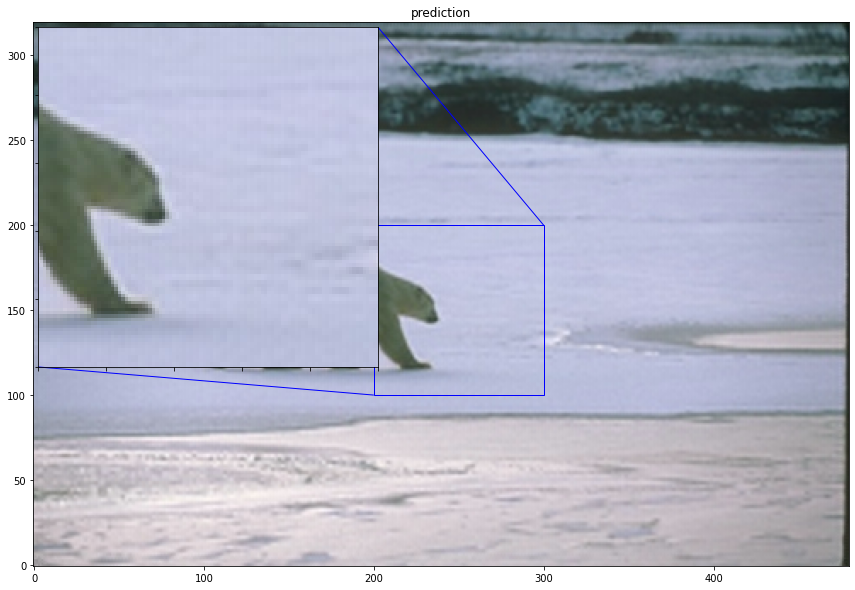

50/50 - 55s - loss: 0.0014 - val_loss: 0.0012 - 55s/epoch - 1s/step
Epoch 22/30
Mean PSNR for epoch: 29.67
50/50 - 60s - loss: 0.0014 - val_loss: 0.0012 - 60s/epoch - 1s/step
Epoch 23/30
Mean PSNR for epoch: 28.02
50/50 - 60s - loss: 0.0015 - val_loss: 0.0017 - 60s/epoch - 1s/step
Epoch 24/30
Mean PSNR for epoch: 29.09
50/50 - 57s - loss: 0.0015 - val_loss: 0.0012 - 57s/epoch - 1s/step
Epoch 25/30
Mean PSNR for epoch: 29.51
50/50 - 56s - loss: 0.0014 - val_loss: 0.0012 - 56s/epoch - 1s/step
Epoch 26/30
Mean PSNR for epoch: 29.05
50/50 - 54s - loss: 0.0014 - val_loss: 0.0012 - 54s/epoch - 1s/step
Epoch 27/30
Mean PSNR for epoch: 29.74
50/50 - 54s - loss: 0.0014 - val_loss: 0.0012 - 54s/epoch - 1s/step
Epoch 28/30
Mean PSNR for epoch: 28.85
50/50 - 52s - loss: 0.0014 - val_loss: 0.0013 - 52s/epoch - 1s/step
Epoch 29/30
Mean PSNR for epoch: 28.96
50/50 - 52s - loss: 0.0014 - val_loss: 0.0012 - 52s/epoch - 1s/step
Epoch 30/30
Mean PSNR for epoch: 29.03
50/50 - 52s - loss: 0.0014 - val_loss

In [122]:
# Train the model
epochs = 30

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

In [123]:
model.save('model_upscale2_ep30/test')

INFO:tensorflow:Assets written to: model_upscale2_ep30/test\assets


INFO:tensorflow:Assets written to: model_upscale2_ep30/test\assets


In [124]:
reconstructed_model=keras.models.load_model('model_upscale2_ep30/test')

In [125]:
reconstructed_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_48 (Conv2D)          (None, None, None, 64)    1664      
                                                                 
 conv2d_49 (Conv2D)          (None, None, None, 64)    36928     
                                                                 
 conv2d_50 (Conv2D)          (None, None, None, 32)    18464     
                                                                 
 conv2d_51 (Conv2D)          (None, None, None, 4)     1156      
                                                                 
 tf.nn.depth_to_space_12 (TF  (None, None, None, 1)    0         
 OpLambda)                                                       
                                                           

1/1 [==============================] - 0s 131ms/step
PSNR of low resolution image and high resolution image is 33.5201
PSNR of predict and high resolution is 34.5241


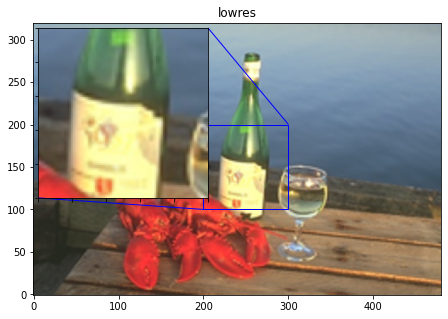

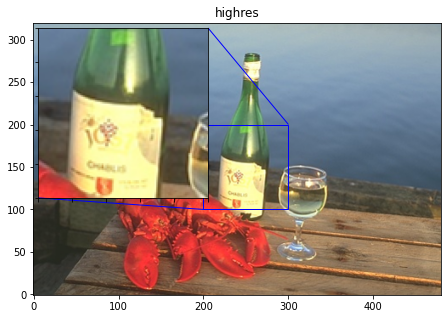

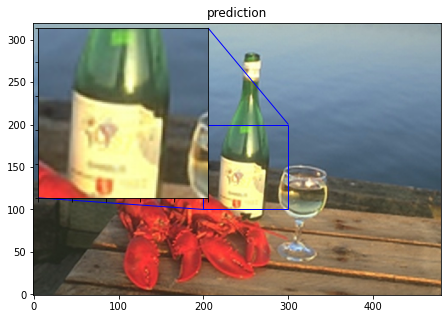

1/1 [==============================] - 0s 70ms/step
PSNR of low resolution image and high resolution image is 28.6322
PSNR of predict and high resolution is 30.0878


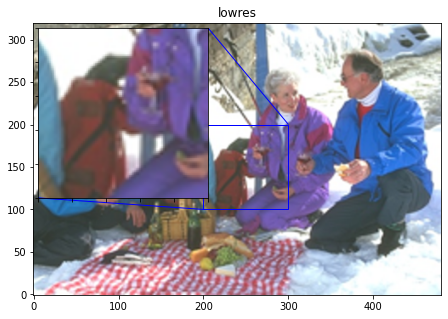

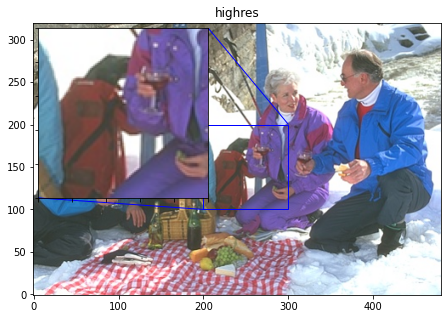

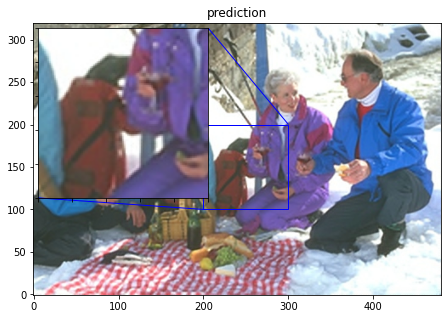

1/1 [==============================] - 0s 110ms/step
PSNR of low resolution image and high resolution image is 31.5546
PSNR of predict and high resolution is 32.4047


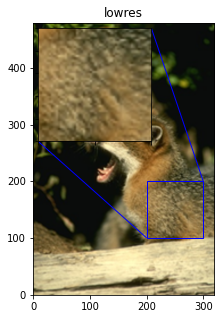

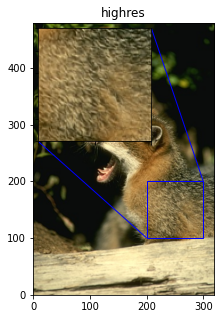

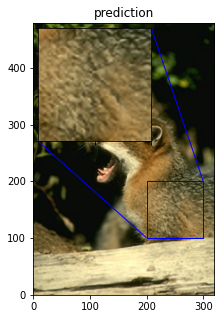

1/1 [==============================] - 0s 64ms/step
PSNR of low resolution image and high resolution image is 31.2229
PSNR of predict and high resolution is 31.9539


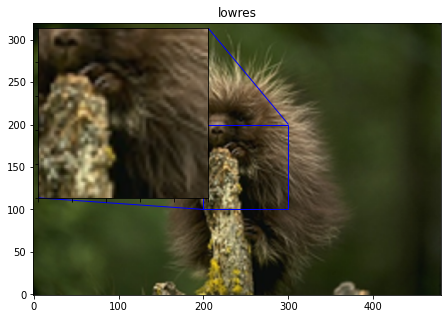

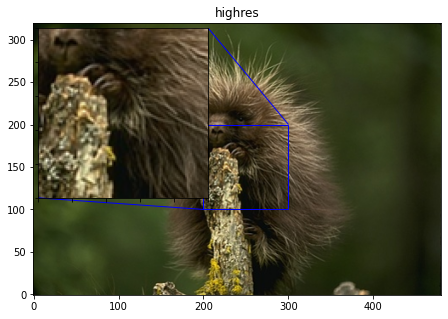

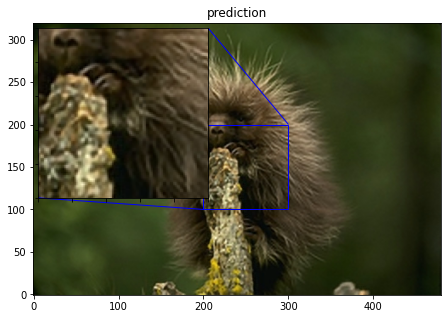

1/1 [==============================] - 0s 67ms/step
PSNR of low resolution image and high resolution image is 28.7185
PSNR of predict and high resolution is 29.7249


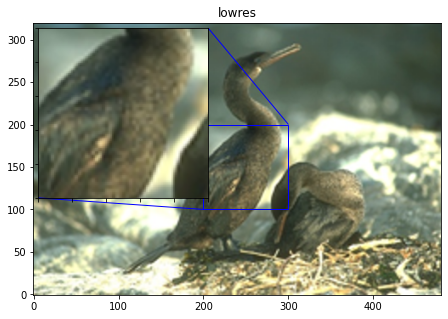

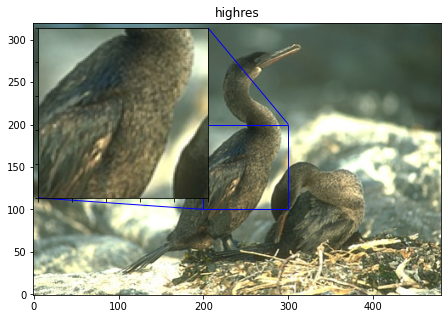

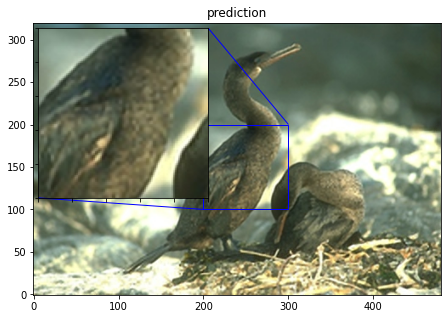

Avg. PSNR of lowres images is 15.3648
Avg. PSNR of reconstructions is 15.8695


In [126]:
# Run model prediction and plot the results
plt.rcParams['figure.figsize'] = [8, 5]
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:55]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

1/1 [==============================] - 0s 250ms/step


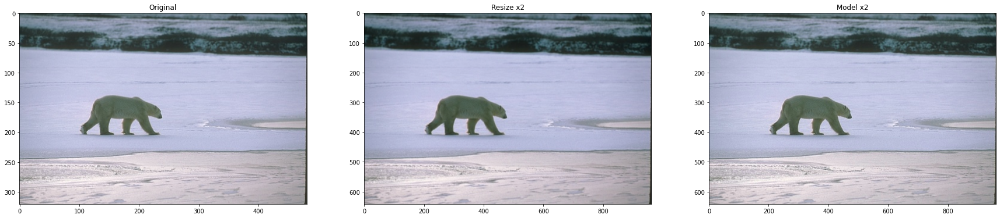

In [195]:
# show one image
img0=load_img(test_img_paths[0])
#img0_resize=img0.resize((img.size[0] * upscale_factor, img.size[1] * upscale_factor))
dim=(img0.size[0] * upscale_factor, img0.size[1] * upscale_factor)
img0_resize = cv2.resize(img_to_array(img0), dim)
img0_resize=array_to_img(img0_resize)
prediction_img0 = upscale_image(reconstructed_model, img0)


plt.rcParams['figure.figsize'] = [30, 10]
plt.subplot(131), plt.imshow(img0), plt.title('Original')
plt.subplot(132), plt.imshow(resized), plt.title('Resize x2')
plt.subplot(133), plt.imshow(prediction_img0), plt.title('Model x2'); 

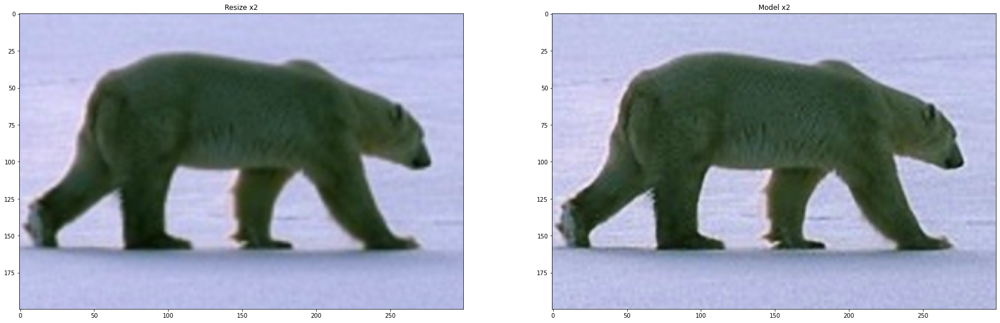

In [204]:
plt.rcParams['figure.figsize'] = [30, 10]
y1=250
y2=450
x1=200
x2=500
plt.subplot(121), plt.imshow(array_to_img(np.array(resized)[y1:y2,x1:x2])), plt.title('Resize x2')
plt.subplot(122), plt.imshow(array_to_img(np.array(prediction_img0)[y1:y2,x1:x2])), plt.title('Model x2'); 

1/1 [==============================] - 0s 268ms/step


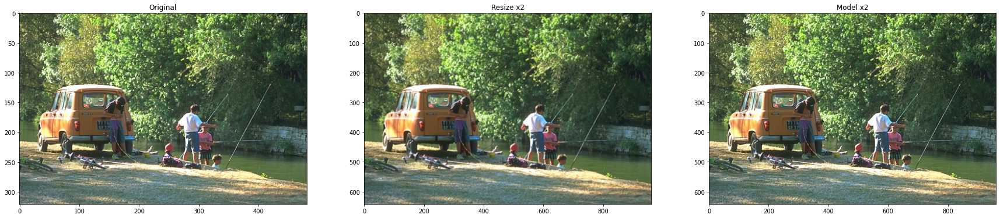

In [205]:
img6=load_img(test_img_paths[6])
dim=(img6.size[0] * upscale_factor, img6.size[1] * upscale_factor)
img6_resize = cv2.resize(img_to_array(img6), dim)
img6_resize=array_to_img(img6_resize)
prediction_img6 = upscale_image(reconstructed_model, img6)

plt.rcParams['figure.figsize'] = [30, 10]
plt.subplot(131), plt.imshow(img6), plt.title('Original')
plt.subplot(132), plt.imshow(img6_resize), plt.title('Resize x2')
plt.subplot(133), plt.imshow(prediction_img6), plt.title('Model x2'); 

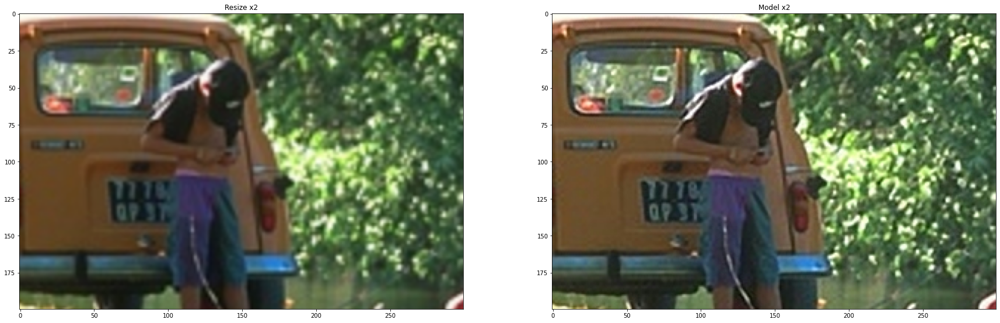

In [197]:
plt.rcParams['figure.figsize'] = [30, 10]
y1=250
y2=450
x1=200
x2=500
plt.subplot(121), plt.imshow(array_to_img(np.array(img6_resize)[y1:y2,x1:x2])), plt.title('Resize x2')
plt.subplot(122), plt.imshow(array_to_img(np.array(prediction_img6)[y1:y2,x1:x2])), plt.title('Model x2'); 

1/1 [==============================] - 0s 271ms/step


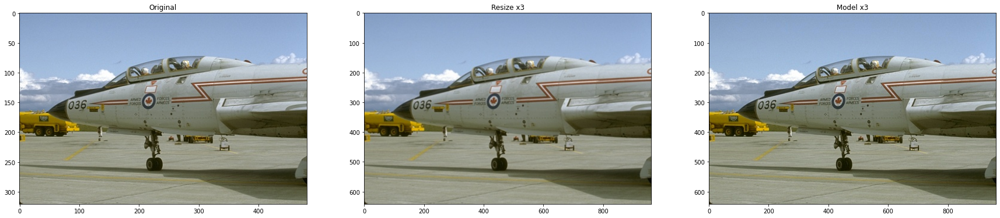

In [198]:
img3=load_img(test_img_paths[3])
dim=(img3.size[0] * upscale_factor, img3.size[1] * upscale_factor)
img3_resize = cv2.resize(img_to_array(img3), dim)
img3_resize=array_to_img(img3_resize)
prediction_img3 = upscale_image(reconstructed_model, img3)

plt.rcParams['figure.figsize'] = [30, 10]
plt.subplot(131), plt.imshow(img3), plt.title('Original')
plt.subplot(132), plt.imshow(img3_resize), plt.title('Resize x3')
plt.subplot(133), plt.imshow(prediction_img3), plt.title('Model x3'); 

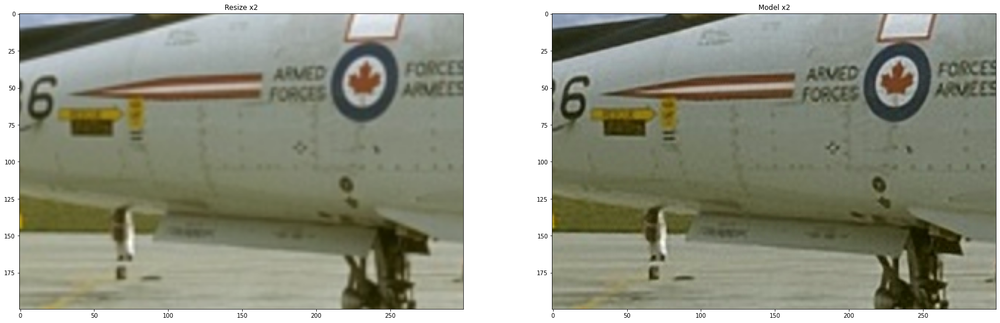

In [201]:
plt.rcParams['figure.figsize'] = [30, 10]
y1=250
y2=450
x1=200
x2=500
plt.subplot(121), plt.imshow(array_to_img(np.array(img3_resize)[y1:y2,x1:x2])), plt.title('Resize x2')
plt.subplot(122), plt.imshow(array_to_img(np.array(prediction_img3)[y1:y2,x1:x2])), plt.title('Model x2'); 